# HAPPY WHALES PROJECT - by Rob Chavez

The idea of this project is simple. If a marine biolgist takes a photo of a whale or dolphin, then is there a quick way to quickly match that whale or dolphin with a database of images of whale and dolphins? Simply put, this is a matching game.


<br>



To solve this problem I took your recommended path of first fine-tuning a YOLOv9 model. I used a free trial of the open source tool called ROBOFLOW to label over 2500 images--taking about 7hrs total. What resulted was a sufficient object detection model that could identify from an image which of the 30 whale or dolphin species it belonged to that are found in this project. Additional information about the data can be found here: https://www.kaggle.com/competitions/happy-whale-and-dolphin



<br>


After developing an object detection model, I fine-tuned a RESNET50 model with training data with the goal of not predicting the species of whale or dolphin but instead using that model to produce embeddings of images. I chose RESNET50 over my original plan of using a SIAMESE NETWORK because it was already pretrained and fast to fine-tune.



<br>


Putting it all together:

(1) I start with an image and identify it's species using the object detection model. <br><br>
(2) I then embed the same image with the fine-tuned RESNET50 model<br><br>
(3) Using the species information from the object detection model, I filter down to only images of that species. I then use the RESNET50 model to embed all of those images<br><br>
(4) Finally, I use cosine similarity to give me the closest matches. <br><br>

My code and my comments are below. I hope you enjoy the experiments below as much as I do!



In [ ]:
import sys
import os
from IPython.display import Image

In [ ]:
#AUTHENTICATE USER
if "google.colab" in sys.modules:
    from google.colab import auth
    auth.authenticate_user()

In [ ]:
#MOUNT GCP BUCKET TO GOOGLE COLAB - Reference: https://cloud.google.com/storage/docs/gcsfuse-install
!sudo rm /etc/apt/sources.list.d/gcsfuse.list
!export GCSFUSE_REPO=gcsfuse-`lsb_release -c -s`
!echo "deb https://packages.cloud.google.com/apt gcsfuse-bionic main" > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | sudo apt-key add -
!sudo apt-get update
!sudo apt-get install gcsfuse
!gcsfuse --implicit-dirs -only-dir=labels happywhales happywhales/

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0Warning: apt-key is deprecated. Manage keyring files in trusted.gpg.d instead (see apt-key(8)).
100  2659  100  2659    0     0  37632      0 --:--:-- --:--:-- --:--:-- 37985
OK
Hit:1 https://packages.cloud.google.com/apt gcsfuse-bionic InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:9 http

Now that I've successfully mounted my bucket to Google Collab, let's take a look at the count of files in my test and train folders that I labeled with roboflow!

In [ ]:
images = os.listdir("/content/happywhales/test/images/")
len(images)

243

In [ ]:
images = os.listdir("/content/happywhales/train/images/")
len(images)

1707

Let's now look at how to load YOLO9; here is my reference point: https://github.com/WongKinYiu/yolov9

In [ ]:
!git clone https://github.com/SkalskiP/yolov9.git

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Total 325 (delta 0), reused 0 (delta 0), pack-reused 325
Receiving objects: 100% (325/325), 2.25 MiB | 12.32 MiB/s, done.
Resolving deltas: 100% (164/164), done.


In [ ]:
!pip3 install -r /content/yolov9/requirements.txt -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.0 MB/s eta 0:00:00


It completed! That's a sigh of relief...let's download the weights now

In [ ]:
HOME = os.getcwd()
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

Now, I want to see if this actually works. Lets load up an image and see what happens

In [ ]:
TEST_IMG = "/content/happywhales/test/images/00144776eb476d_jpg.rf.62389bfa25d83be5b817d0e7f513c2c3.jpg"
!python /content/yolov9/detect.py --weights {HOME}/weights/gelan-c.pt --conf 0.1 --source {TEST_IMG}

detect: weights=['/content/weights/gelan-c.pt'], source=/content/happywhales/test/images/00144776eb476d_jpg.rf.62389bfa25d83be5b817d0e7f513c2c3.jpg, data=yolov9/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov9/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 467 layers, 25472640 parameters, 0 gradients, 102.8 GFLOPs
image 1/1 /content/happywhales/test/images/00144776eb476d_jpg.rf.62389bfa25d83be5b817d0e7f513c2c3.jpg: 640x640 (no detections), 17.8ms
Speed: 0.6ms pre-process, 17.8ms inference, 124.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov9/runs/det

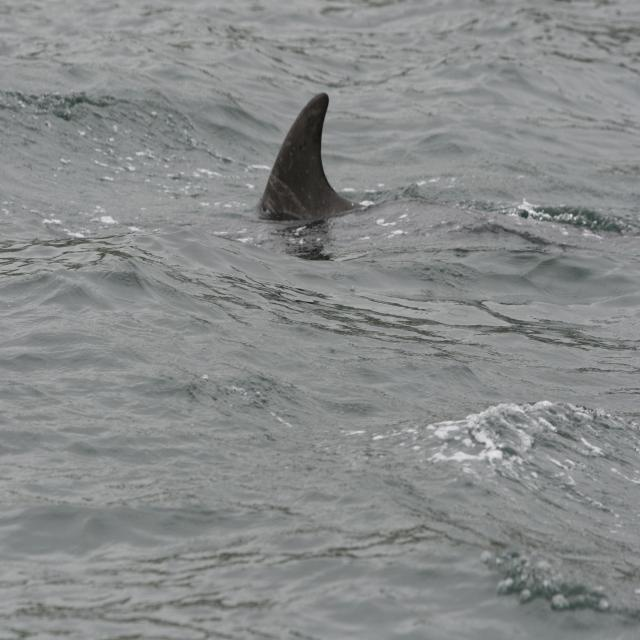

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/detect/exp/00144776eb476d_jpg.rf.62389bfa25d83be5b817d0e7f513c2c3.jpg", width=600)

That returned no bounding boxes, lets try something more conventional... from my home computer I uploaded a picture of a dog and plan to repeat the exerices above

In [ ]:
!mv /dog.jpeg /content/yolov9/data/

In [ ]:
TEST_IMG = "/content/yolov9/data/dog.jpeg"
!python /content/yolov9/detect.py --weights {HOME}/weights/gelan-c.pt --conf 0.1 --source {TEST_IMG}

detect: weights=['/content/weights/gelan-c.pt'], source=/content/yolov9/data/dog.jpeg, data=yolov9/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov9/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 467 layers, 25472640 parameters, 0 gradients, 102.8 GFLOPs
image 1/1 /content/yolov9/data/dog.jpeg: 480x640 1 dog, 173.0ms
Speed: 0.5ms pre-process, 173.0ms inference, 623.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov9/runs/detect/exp2


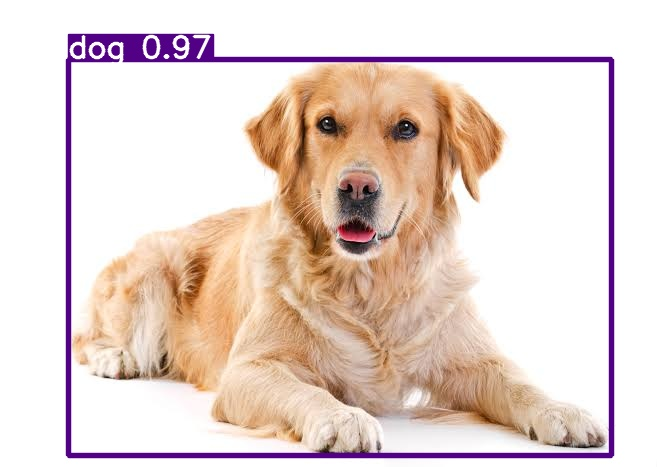

In [ ]:
filename = "/content/yolov9/runs/detect/exp2/dog.jpeg"
Image(filename=filename, width=600)

It worked that time! But...looks like we have to train a model for the whale and dolphin dataset... let's go ahead and start. I labeled the data using roboflow and conviently have a yaml file that came with my download of the labeled images that shows the path, number of species that need to be classified, and the names of species. The information below is updated with the correct path information.

In [ ]:
!mv /data.yaml /content/yolov9/data/

In [ ]:
!cat /content/yolov9/data/data.yaml

train: /content/happywhales/train/images
val: /content/happywhales/valid/images
test: /content/happywhales/test/images

nc: 26
names: ['beluga', 'blue_whale', 'bottlenose_dolphin', 'brydes_whale', 'commersons_dolphin', 'common_dolphin', 'cuviers_beaked_whale', 'dusky_dolphin', 'false_killer_whale', 'fin_whale', 'frasiers_dolphin', 'globis', 'gray_whale', 'humpback_whale', 'killer_whale', 'melon_headed_whale', 'minke_whale', 'pantropic_spotted_dolphin', 'pilot_whale', 'pygmy_killer_whale', 'rough_toothed_dolphin', 'sei_whale', 'southern_right_whale', 'spinner_dolphin', 'spotted_dolphin', 'white_sided_dolphin']


In [ ]:
!nvidia-smi

Mon Apr 15 21:37:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0              44W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

The parameters used below where pulled from the documentation cited below. Bottom-line, i wanted to fine-tune a YOLO model and learned I could best do that by freezing the first 10 layers of the pretrained model

In [ ]:
#pulled from https://docs.ultralytics.com/usage/cfg/#train-settings
#https://docs.ultralytics.com/yolov5/tutorials/transfer_learning_with_frozen_layers/#freeze-backbone
!python /content/yolov9/train.py \
--batch 16 --epochs 200 --img 640 --device 0 --close-mosaic 10 --cache True --freeze 10 --optimizer 'AdamW' \
--data /content/yolov9/data/data.yaml \
--weights /content/weights/gelan-c.pt \
--cfg /content/yolov9/models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

2024-04-15 21:39:34.967401: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-15 21:39:34.967454: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-15 21:39:34.969469: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-15 21:39:36.004097: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/weights/gelan-c.pt, cfg=/content/yolov9/models/detect/gelan-c.yaml, data=/content/yolov9/data/data.yaml, hyp=hyp.scratch-high.yaml, epochs=200, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=F

The authors of the YOLOv9 model conviently make the following metrics/analytics available after training. It doesn't look like adding more epochs would really make that much of a difference

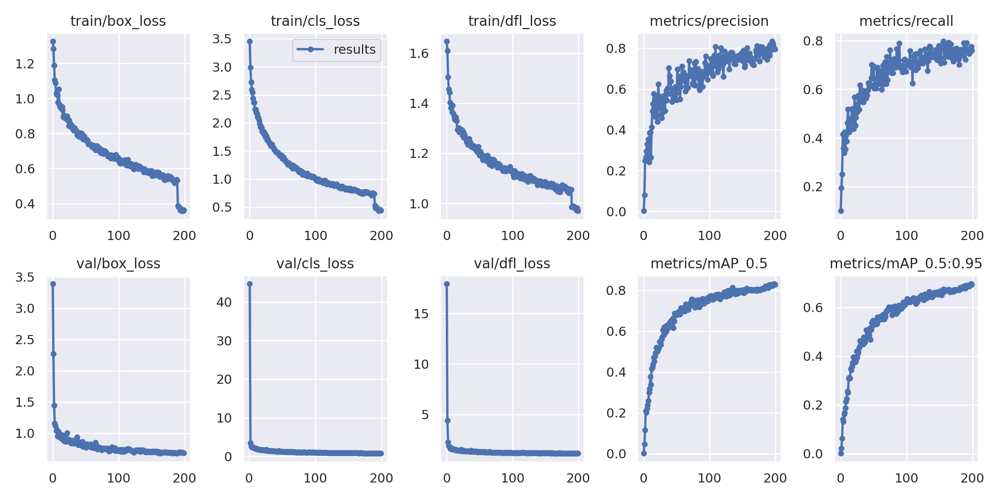

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp/results.png", width=1000)

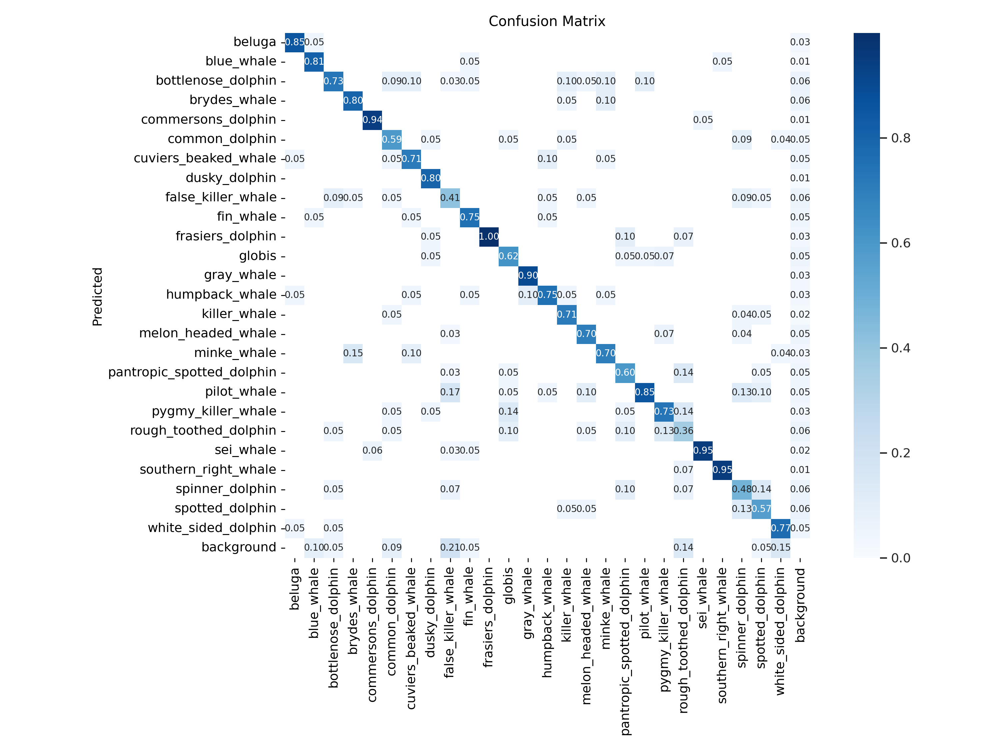

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp/confusion_matrix.png", width=1000)

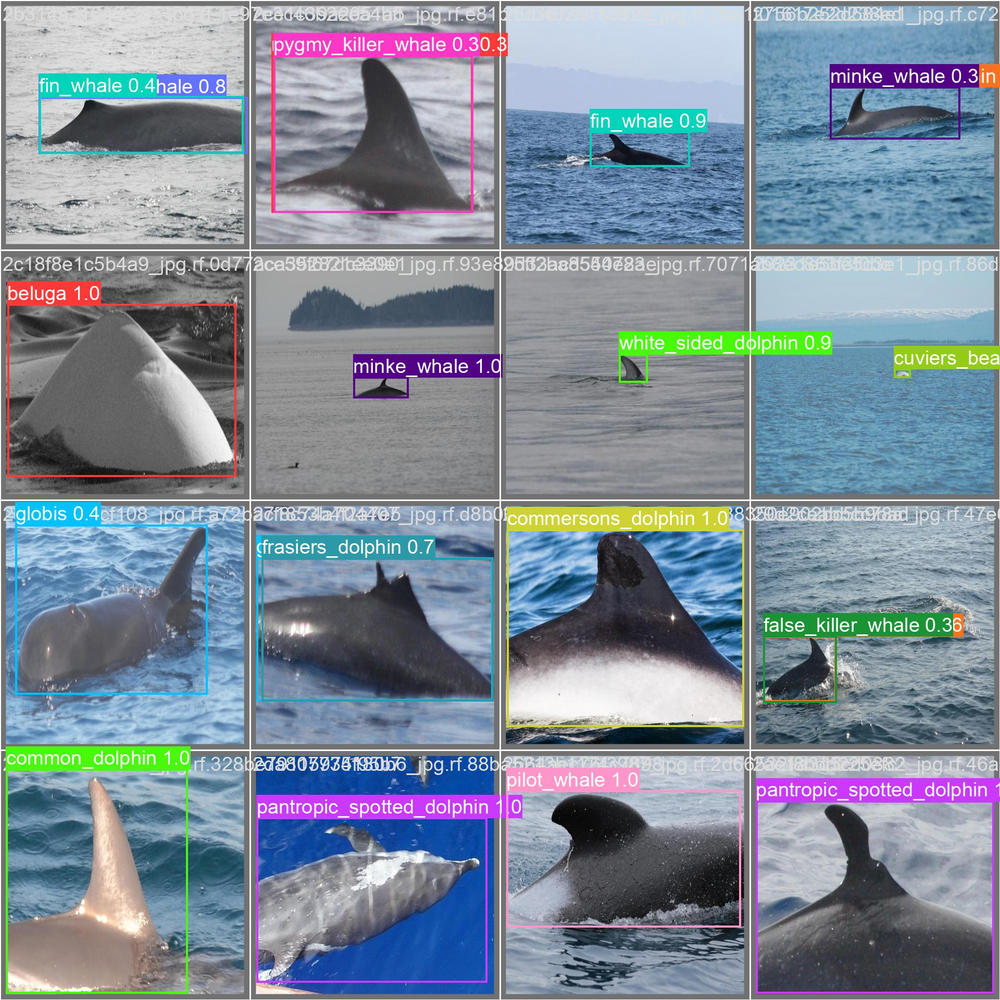

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp/val_batch2_pred.jpg", width=1000)

With my object detection model completed with "OK" results, let's work on fine-tuning a RESNET50 model with the goal of not classification but getting the embeddings of images. THe code below isn't beautifully written but should capture the experimentation process I went through to figure out how to get the image embeddings.

In [ ]:
#PACKAGES USED
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import pandas as pd
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt

In [ ]:
#LOAD THE METADATA ABOUT THE IMAGES
!mv /train.csv /content/
df = pd.read_csv("/content/train.csv")
df.head()

mv: cannot stat '/train.csv': No such file or directory


,image,species,individual_id
0,00021adfb725ed.jpg,melon_headed_whale,cadddb1636b9
1,000562241d384d.jpg,humpback_whale,1a71fbb72250
2,0007c33415ce37.jpg,false_killer_whale,60008f293a2b
3,0007d9bca26a99.jpg,bottlenose_dolphin,4b00fe572063
4,00087baf5cef7a.jpg,humpback_whale,8e5253662392


In [ ]:
#INFORMATION NEEDED ABOUT THE SPECIES
species = df.species.unique()
species_index = {s: i for i, s in enumerate(species)}
reverse_species_index = {i: s for s, i in species_index.items()}
num_species = len(species)

In [ ]:
#LISTING ALL IMAGE AND LABEL INFORMATION
files = os.listdir("/content/happywhales/train/images")
filenames = [f.split(".")[0].replace("_",".") for f in files]
fullname = [f"/content/happywhales/train/images/{f}" for f in files]
records = [{"filename": f"{f2}",
            "label": species_index[df[df["image"] == f1]["species"].values[0]]} \
           for f1, f2 in zip(filenames, fullname)]

In [ ]:
images = [record["filename"] for record in records]
labels = [record["label"] for record in records]
print(images[:3])
print(labels[:3])

['/content/happywhales/train/images/001f1a1f22da96_jpg.rf.efad017df2f8e98e359efdd21edc983e.jpg', '/content/happywhales/train/images/0036b5c11b39f3_jpg.rf.0f4362ceb24420424e75804fe088ea1d.jpg', '/content/happywhales/train/images/005b72434149fa_jpg.rf.ae970d44d197412e2e4c5de070a06b92.jpg']
[5, 12, 13]


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.transform = transform
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        image = Image.open(img_name)
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor()
])

In [ ]:
#LOAD DATASET
dataset = ImageDataset(images, labels, transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=False)

In [ ]:
#HERE YOU CAN SEE THAT I FREEZE THE LAST LAYER-- https://discuss.pytorch.org/t/what-does-the-fc-in-feature-mean/4889
model = resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, num_species)  # 30 classes

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
#THIS IS MY TRAINING LOOP - I SHOULD HAVE CHOSEN A LARGER EPOCH SIZE
model.train()
num_epochs = 10
for epoch in range(num_epochs):
    total_loss = 0
    for inputs, labels in dataloader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f'Epoch {epoch+1}, Average Loss: {total_loss/len(dataloader)}')

Epoch 1, Average Loss: 3.114340862381124
Epoch 2, Average Loss: 2.7395272967971374
Epoch 3, Average Loss: 2.4721831161285115
Epoch 4, Average Loss: 2.290088606772022
Epoch 5, Average Loss: 2.1522436231096216
Epoch 6, Average Loss: 1.9865582368084203
Epoch 7, Average Loss: 1.8633777471346276
Epoch 8, Average Loss: 1.7753832579773163
Epoch 9, Average Loss: 1.692108433937358
Epoch 10, Average Loss: 1.5936553210855644


OK, let's test this thing! Here is a randomly chosen image

In [ ]:
test_img = "/content/happywhales/train/images/00f9b3f53e440e_jpg.rf.97e7853a3634498db362e4dd4e375837.jpg"
df[df.image == "00f9b3f53e440e.jpg"].species

160    commersons_dolphin
Name: species, dtype: object

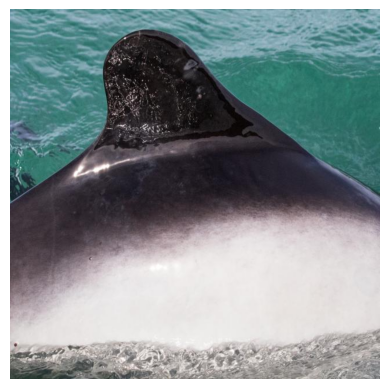

In [ ]:
img = Image.open(test_img)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

In [ ]:
df[df.image == "00f9b3f53e440e.jpg"].index

Index([160], dtype='int64')

I know want to (1) see if I can actually predict the label using the RESNET50 model--- and as expected, it works!

In [ ]:
def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
    image = Image.open(image_path)
    image = transform(image).unsqueeze(0)
    return image

In [ ]:
def predict(image_tensor, model, device):
    model.eval()  # Set the model to evaluation mode
    image_tensor = image_tensor.to(device)

    with torch.no_grad():  # No need to track gradients for inference
        outputs = model(image_tensor)
        _, predicted = torch.max(outputs, 1)  # Get the index of the max log-probability
        return predicted.item()

In [ ]:
image_tensor = preprocess_image(test_img)

# Assuming your model and device are already defined
predicted_class = predict(image_tensor, model, device)
print(f'The predicted class is: {reverse_species_index[predicted_class]}')

The predicted class is: commersons_dolphin


ALright, since I don't want to predict species here, i only take the emebeddings as an output

In [ ]:
model.fc = torch.nn.Identity()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Now, I can create function that will embed all of my data. See below

In [ ]:
# Function to extract embeddings
def extract_embeddings(dataloader, model):
    with torch.no_grad():
        embeddings = []
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            output = model(imgs)
            embeddings.append(output.view(output.size(0), -1).cpu().numpy())
    return np.concatenate(embeddings, axis=0)

In [ ]:
embeddings = extract_embeddings(dataloader, model)

Let's do a test! I take my randomly chosen image and embed it. I also embed all of my training data. Let's see if I can find the image using cosine similiarty. It should be 1 or close to 1.

In [ ]:
def predict_embeddings(image_tensor, model, device):
    model.eval()
    image_tensor = image_tensor.to(device)

    with torch.no_grad():  # No need to track gradients for inference
        output = model(image_tensor)
        return output.view(output.size(0), -1).cpu().numpy()

In [ ]:
image_tensor = preprocess_image(test_img)
tensor_embedding = predict_embeddings(image_tensor, model, device)
tensor_embedding

array([[0.02334056, 0.34858462, 0.19463497, ..., 0.02381814, 0.06444674,
        0.41266406]], dtype=float32)

In [ ]:
target_embedding = tensor_embedding.flatten()
target_embedding.shape

(2048,)

In [ ]:
embeddings[0].shape

(2048,)

In [ ]:
def find_most_similar_embedding(embeddings, target_embedding):
    # Calculate cosine similarities (1 - cosine distance)
    similarities = [1 - distance.cosine(embed, target_embedding) for embed in embeddings]

    # Find the index of the maximum similarity
    most_similar_index = np.argmax(similarities)

    # Return the index and the similarity score
    return most_similar_index, similarities[most_similar_index], similarities

# Get the index of the most similar embedding and the similarity score
most_similar_index, similarity_score, similarities = find_most_similar_embedding(embeddings, target_embedding)

print(f"The most similar image is at index {most_similar_index} with a similarity score of {similarity_score}")


The most similar image is at index 6 with a similarity score of 0.9999998807907104


In [ ]:
indexes = []
for i, sim in enumerate(similarities):
  if sim > 0.9:
    indexes.append(int(i))
    print(f"Index {i} has a similarity score of {sim}")

Index 6 has a similarity score of 0.9999998807907104
Index 23 has a similarity score of 0.9262900948524475
Index 26 has a similarity score of 0.9222782850265503
Index 77 has a similarity score of 0.9121753573417664
Index 190 has a similarity score of 0.9274499416351318
Index 316 has a similarity score of 0.9313165545463562
Index 762 has a similarity score of 0.9178245067596436
Index 879 has a similarity score of 0.9186550974845886
Index 1377 has a similarity score of 0.9345319867134094
Index 1409 has a similarity score of 0.9160204529762268
Index 1516 has a similarity score of 0.9073349833488464
Index 1630 has a similarity score of 0.9196391105651855
Index 1666 has a similarity score of 0.9017292857170105


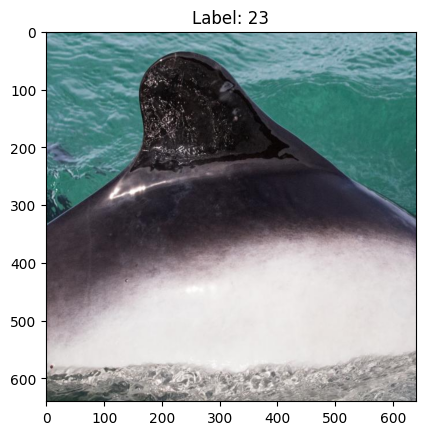

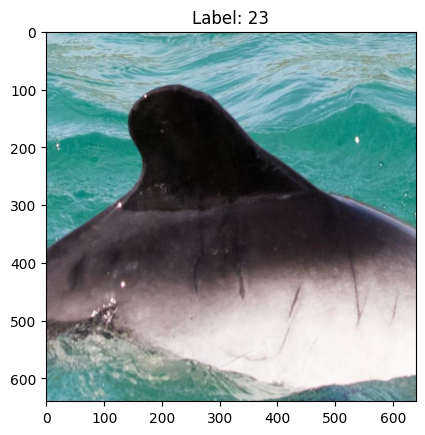

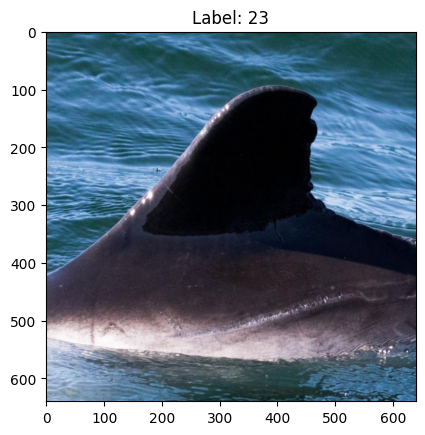

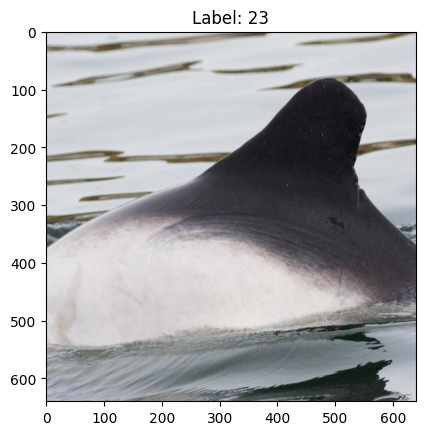

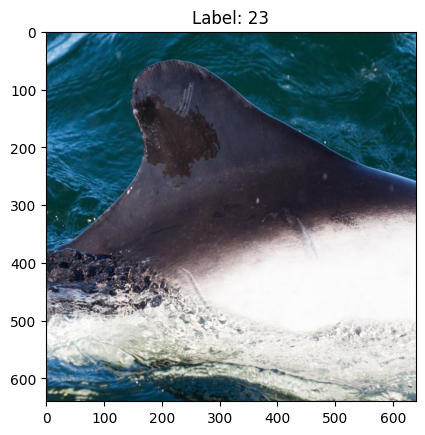

...

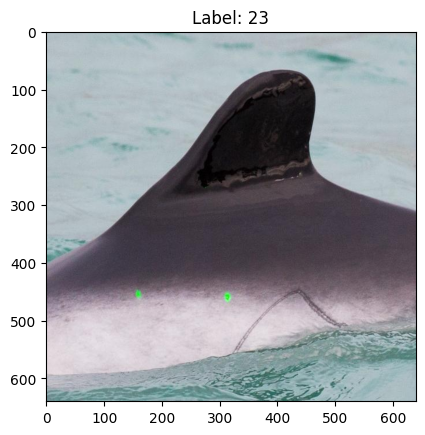

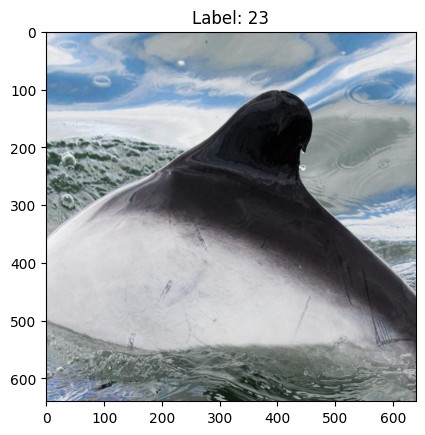

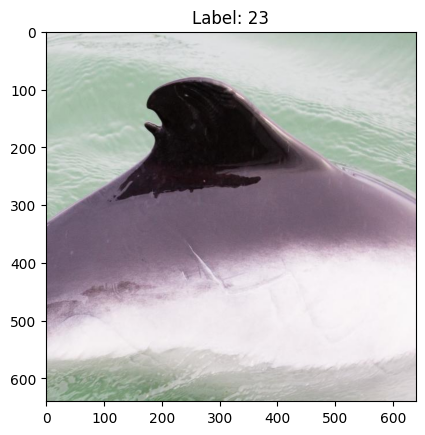

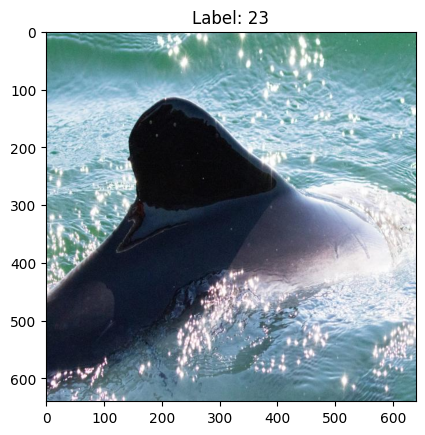

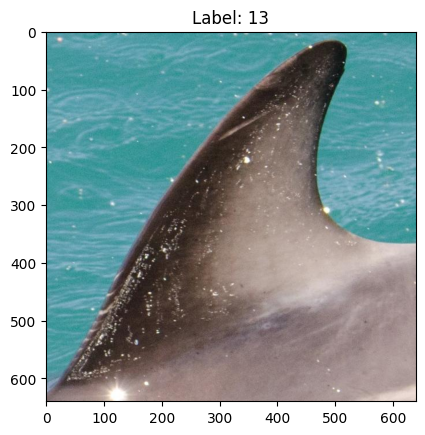

In [ ]:
for i in indexes:

  image, label = dataset[i]

  # make sure image is a tensor
  if isinstance(image, torch.Tensor):
      image = image.permute(1, 2, 0)
      image = image.numpy()
      image = (image * 255).astype(np.uint8)

  image_pil = Image.fromarray(image)
  plt.imshow(image_pil)
  plt.title(f'Label: {label}')
  plt.show()

In [ ]:
reverse_species_index[23]

'commersons_dolphin'

The code below puts it all together! Starting first with object detection, filtering based on species, embedding the starting image and filtered data, and then using cosine similiarity to find the closest matches.

<br>

Let's start with object detection!

In [ ]:
!python /content/yolov9/detect.py \
--img 640 --conf 0.1 --device 0 \
--weights /content/yolov9/runs/train/exp/weights/best.pt \
--source {test_img}

detect: weights=['/content/yolov9/runs/train/exp/weights/best.pt'], source=/content/happywhales/train/images/00f9b3f53e440e_jpg.rf.97e7853a3634498db362e4dd4e375837.jpg, data=yolov9/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov9/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25431006 parameters, 0 gradients, 102.6 GFLOPs
image 1/1 /content/happywhales/train/images/00f9b3f53e440e_jpg.rf.97e7853a3634498db362e4dd4e375837.jpg: 640x640 1 commersons_dolphin, 17.2ms
Speed: 0.6ms pre-process, 17.2ms inference, 762.8ms NMS per image at shape (1, 3, 640, 640)
Res

THe object detector with high probability says the image is of a commerson dolphin. Cool!

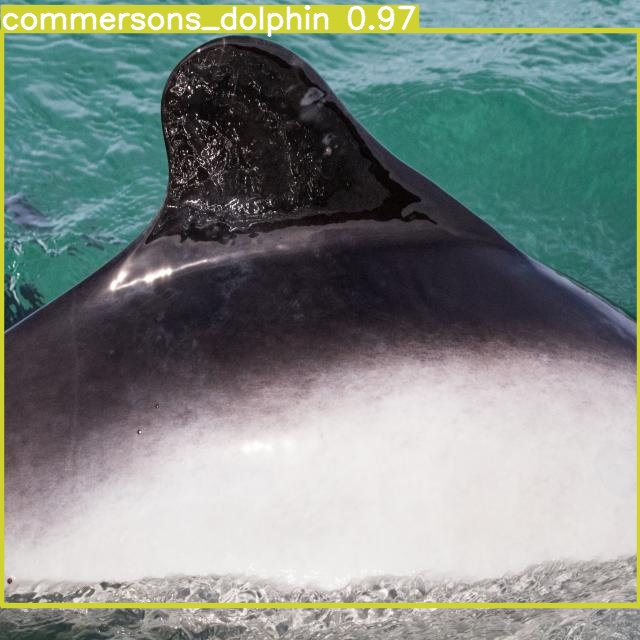

In [ ]:
from IPython.display import Image
filename = "/content/yolov9/runs/detect/exp5/00f9b3f53e440e_jpg.rf.97e7853a3634498db362e4dd4e375837.jpg"
Image(filename=filename, width=600)

In [ ]:
df.head()

,image,species,individual_id
0,00021adfb725ed.jpg,melon_headed_whale,cadddb1636b9
1,000562241d384d.jpg,humpback_whale,1a71fbb72250
2,0007c33415ce37.jpg,false_killer_whale,60008f293a2b
3,0007d9bca26a99.jpg,bottlenose_dolphin,4b00fe572063
4,00087baf5cef7a.jpg,humpback_whale,8e5253662392


I know only want record information (images) that are in my training data, including the index information

In [ ]:
df_images = df.image.unique()
common_images = []
for r in records:
  r =r['filename'].split("/")[-1]
  r = r.split(".")[0]
  r = r.replace("_", ".")
  common_images.append(r)

In [ ]:
len(common_images)

1707

In [ ]:
common_image_indexes = []
for img in df.image.unique():
  if img in common_images:
    common_image_indexes.append(df[df.image == img].index.values[0])

In [ ]:
len(common_images)

1707

I know use that index information to select rows only in my training data for this project

In [ ]:
selected_rows = df.loc[common_image_indexes]
selected_rows

,image,species,individual_id
19,001f1a1f22da96.jpg,minke_whale,780fefdb6198
35,0036b5c11b39f3.jpg,pilot_whale,fefd0899a5dc
60,005b72434149fa.jpg,dusky_dolphin,2fad69faf2a4
89,008705d384b02a.jpg,killer_whale,fe8052dcc19e
101,009a307f9f483c.jpg,spinner_dolphin,49e75f3dfbec
...,...,...,...
50931,ff7c4db150d343.jpg,blue_whale,592ba121621f
50940,ff86d9fa973ca6.jpg,southern_right_whale,93a2af30bf2c
50984,ffba32adc39e48.jpg,cuviers_beaked_whale,4d05b4368780
50999,ffcee8fa2578c1.jpg,bottlenose_dolphin,a6e325d8e924


Out of this data, I only want to filter to commerson_dolphins. I don't want to look at the other species

In [ ]:
commerson_dolphins = selected_rows[selected_rows.species == "commersons_dolphin"]

THis results in 63 images that will need to be evaluated rather than 1707

In [ ]:
len(commerson_dolphins)

63

And from those 63 images, we can see several images that have the same individual_id that exist. THe code below finds thos individual_Ids and chooses one of them for a test. I want to see if I can take the first image from one of those individual_ids and find the other images associated with it.

In [ ]:
len(commerson_dolphins.individual_id.unique())

50

In [ ]:
duplicates = commerson_dolphins['individual_id'].duplicated(keep=False)
duplicate_values = commerson_dolphins[duplicates]
print(duplicate_values)

                    image             species individual_id
6371   1fb52f50276216.jpg  commersons_dolphin  78326d122594
7229   242516e3ec11e8.jpg  commersons_dolphin  fd9ef42185f5
7424   2522109e5a89f8.jpg  commersons_dolphin  97c7974d2c42
8432   2a60979351f659.jpg  commersons_dolphin  97c7974d2c42
10939  3744f9b6e1a5f1.jpg  commersons_dolphin  22dd5670f839
16228  51eda5fc5c55c4.jpg  commersons_dolphin  ccaf64734674
16386  52d5e31a265598.jpg  commersons_dolphin  0c2f258761c2
17031  55e449e272c97d.jpg  commersons_dolphin  291bf3316e8e
24673  7cb2789c573ecd.jpg  commersons_dolphin  22dd5670f839
26631  8675586df6ece0.jpg  commersons_dolphin  291bf3316e8e
27603  8b2e4bd6a90d4a.jpg  commersons_dolphin  2ff40fac559d
32041  a1148c11e1f880.jpg  commersons_dolphin  291bf3316e8e
32734  a4ab0f2bd682e1.jpg  commersons_dolphin  2ff40fac559d
33683  a94f1234c068e0.jpg  commersons_dolphin  ccaf64734674
37543  bcbd6b964f72b0.jpg  commersons_dolphin  78326d122594
38060  bf2fb4bafb347e.jpg  commersons_do

I see several images with individual_id = 291bf3316e8e. Let's test it out!

In [ ]:
commerson_dolphins[commerson_dolphins.individual_id == "291bf3316e8e"]

,image,species,individual_id
17031,55e449e272c97d.jpg,commersons_dolphin,291bf3316e8e
26631,8675586df6ece0.jpg,commersons_dolphin,291bf3316e8e
32041,a1148c11e1f880.jpg,commersons_dolphin,291bf3316e8e
45630,e576fc0c79ab5d.jpg,commersons_dolphin,291bf3316e8e


The code below merely stages the test and ensures I can read it the data from the correct path.

In [ ]:
train_images = os.listdir("/content/happywhales/train/images")
trainfilename = []
for img in commerson_dolphins.image.unique():
  for train_image in train_images:
    if train_image.startswith(img.split(".")[0]):
      trainfilename.append(f"/content/happywhales/train/images/{train_image}")
      continue
len(trainfilename)

63

In [ ]:
commerson_labels = [23] * 63

In [ ]:
# Load dataset
dataset = ImageDataset(trainfilename, commerson_labels, transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=False)

FIrst, I embed all the commerson dolphin images with the fine tuned RESNET50 model

In [ ]:
from PIL import Image
commerson_dolphin_embeddings = extract_embeddings(dataloader, model)

In [ ]:
test_commerson = commerson_dolphins[commerson_dolphins.individual_id == "291bf3316e8e"]

In [ ]:
train_images = os.listdir("/content/happywhales/train/images")
commerson_trainfilename = []
for img in test_commerson.image.unique():
  for train_image in train_images:
    if train_image.startswith(img.split(".")[0]):
      commerson_trainfilename.append(f"/content/happywhales/train/images/{train_image}")
      continue
len(commerson_trainfilename)

4

I then embed the test image. Let's look at the RESULTS below!

In [ ]:
new_test_img = commerson_trainfilename[0]

In [ ]:
image_tensor = preprocess_image(new_test_img)
tensor_embedding = predict_embeddings(image_tensor, model, device)
target_embedding = tensor_embedding.flatten()

In [ ]:
# Get the index of the most similar embedding and the similarity score
most_similar_index, similarity_score, similarities = find_most_similar_embedding(commerson_dolphin_embeddings, target_embedding)

print(f"The most similar image is at index {most_similar_index} with a similarity score of {similarity_score}")
indexes = []
for i, sim in enumerate(similarities):
  if sim > 0.9:
    indexes.append(int(i))
    print(f"Index {i} has a similarity score of {sim}")

The most similar image is at index 21 with a similarity score of 0.9999998807907104
Index 1 has a similarity score of 0.9256292581558228
Index 6 has a similarity score of 0.9418073892593384
Index 12 has a similarity score of 0.9455300569534302
Index 17 has a similarity score of 0.9173332452774048
Index 19 has a similarity score of 0.9010447263717651
Index 21 has a similarity score of 0.9999998807907104
Index 29 has a similarity score of 0.9159529805183411
Index 37 has a similarity score of 0.9790160655975342
Index 42 has a similarity score of 0.9339792728424072
Index 43 has a similarity score of 0.9347624182701111
Index 50 has a similarity score of 0.9214282035827637
Index 51 has a similarity score of 0.9075117111206055
Index 62 has a similarity score of 0.9166541695594788


HERE ARE THE ORIGNAL FOUR IMAGES I WANT TO SEE IN MY RESULTS BELOW!

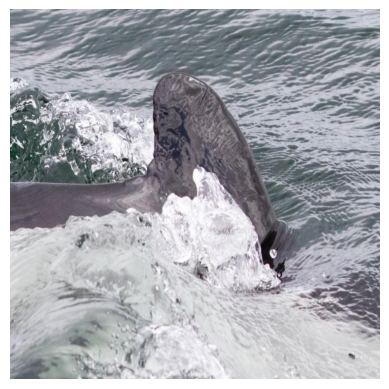

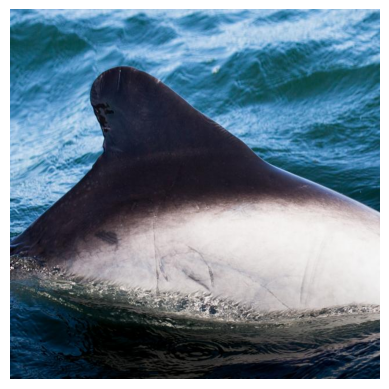

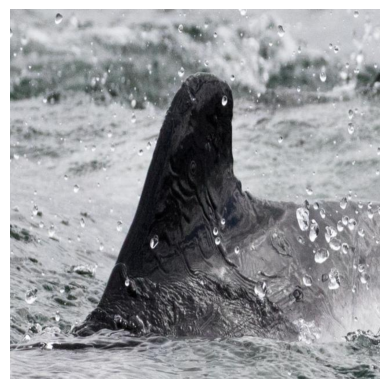

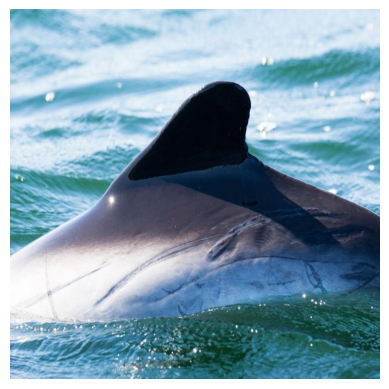

In [ ]:
for cimg in commerson_trainfilename:
  img = Image.open(cimg)
  img = np.array(img)
  plt.imshow(img)
  plt.axis('off')
  plt.show()

NOT PERFECT, BUT NOT BAD EITHER!  Hope you enjoyed this project!

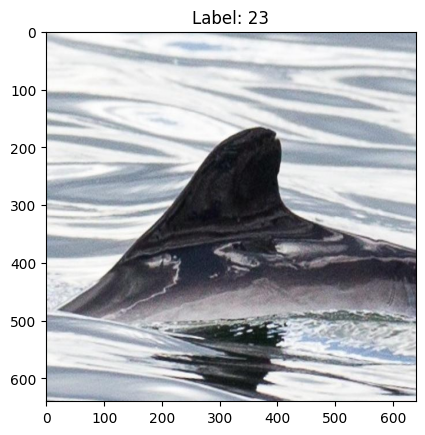

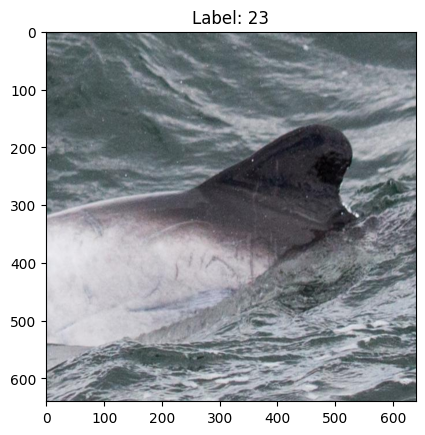

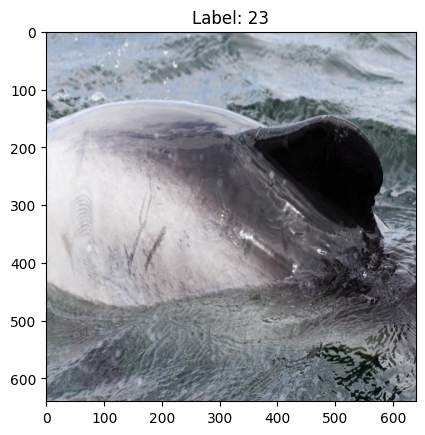

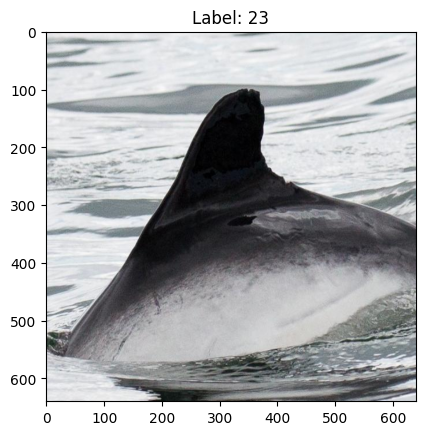

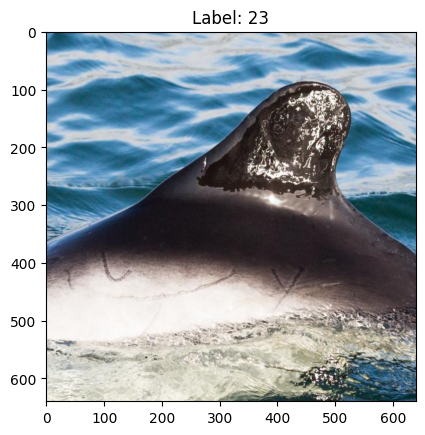

...

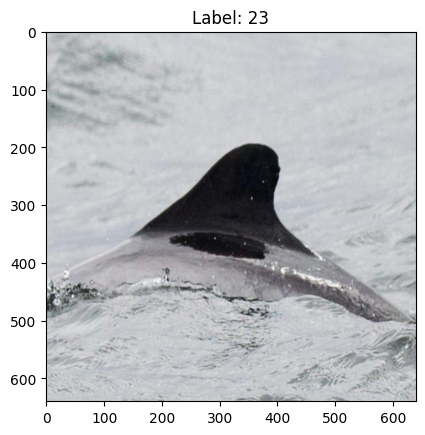

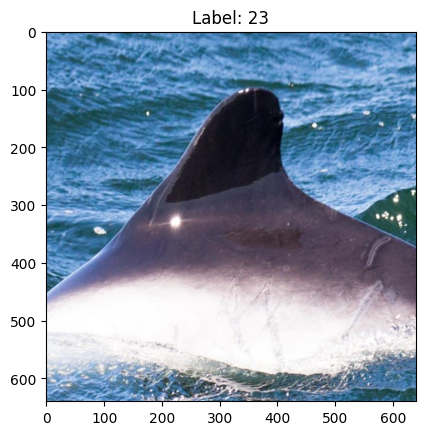

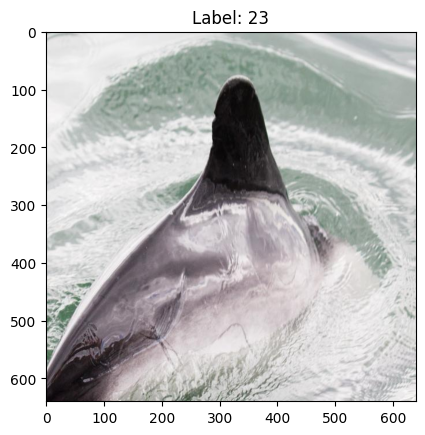

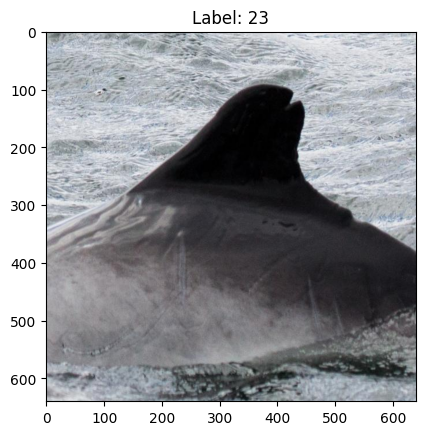

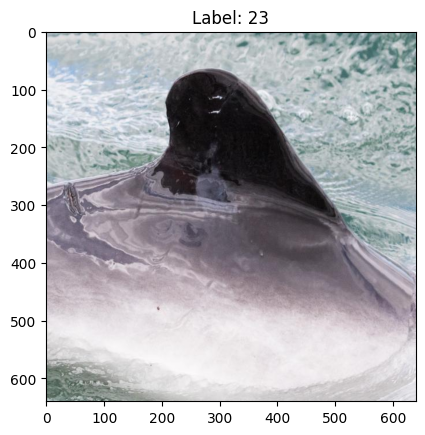

In [ ]:
for i in indexes:

  image, label = dataset[i]

  # make sure image is a tensor
  if isinstance(image, torch.Tensor):
      image = image.permute(1, 2, 0)
      image = image.numpy()
      image = (image * 255).astype(np.uint8)

  image_pil = Image.fromarray(image)
  plt.imshow(image_pil)
  plt.title(f'Label: {label}')
  plt.show()